In [1]:
import pandas as pd
from itertools import combinations
import seaborn as sns
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
from bokeh.plotting import figure, show, output_notebook
output_notebook()

Loading BokehJS ...

In [2]:
cvd_genes = pd.read_csv('data/cvd_genes.csv')

In [3]:
coord = pd.read_csv('data/HPI_2D_ParametricUMAP.csv')

In [4]:
#ppi in 2d space
g = figure(plot_width=600, plot_height=600, title='ppi in 2D embedding')
g.xgrid.visible = False
g.xaxis.visible = False
g.ygrid.visible = False
g.yaxis.visible = False

g.scatter(x='x_2d', y='y_2d', source=coord, size=2, color='grey')
show(g)

# Dominant Disease Gene Sets

In [5]:
cvd_genes.groupby(['efoId', 'efoName'])['GeneId'].size().sort_values()[20:]

efoId            efoName                                                
Orphanet_104     leber hereditary optic neuropathy                           26
EFO_0003827      pulmonary embolism                                          26
MONDO_0024573    familial hypertrophic cardiomyopathy                        27
Orphanet_3286    catecholaminergic polymorphic ventricular tachycardia       28
EFO_0009142      autosomal dominant dilated cardiomyopathy                   30
Orphanet_2573    moyamoya disease                                            31
EFO_1001771      cardiac edema                                               31
EFO_0003780      behcet's syndrome                                           32
EFO_0001361      pulmonary arterial hypertension                             33
Orphanet_648     noonan syndrome                                             33
Orphanet_247     arrhythmogenic right ventricular dysplasia                  33
EFO_0005524      large artery stroke           

# Which disease should we focus on?

In [6]:
sel_dis = {'coronary artery disease', 'coronary atherosclerosis', 'myocardial infarction'}

In [7]:
cvd_genes_flt = cvd_genes[cvd_genes.efoName.isin(sel_dis)]

In [8]:
cvd_genes_flt = cvd_genes_flt.groupby(['efoId', 'efoName'])['GeneId'].apply(set).reset_index()
cvd_genes_flt['color'] = sns.color_palette('Set1', cvd_genes_flt.shape[0]).as_hex()
cvd_genes_flt['GeneId']=cvd_genes_flt['GeneId'].apply(list)
cvd_genes_flt = cvd_genes_flt.explode('GeneId').merge(coord[['GeneId', 'x_2d', 'y_2d']], on='GeneId', how='left')

In [9]:
#number of Genes likned to more than one disease
cvd_genes_flt.groupby('GeneId')['efoName'].size().value_counts()

1    444
2    120
3     71
Name: efoName, dtype: int64

In [10]:
#to show disease-specific genes only
df = cvd_genes_flt[cvd_genes_flt.GeneId.isin([k for k,v in cvd_genes_flt.groupby('GeneId')['efoName'].size().to_dict().items() if v==1])]

In [11]:
df.efoName.value_counts()

coronary artery disease     382
myocardial infarction        49
coronary atherosclerosis     13
Name: efoName, dtype: int64

In [12]:
#ppi in 2d space (specific genes)
g = figure(plot_width=600, plot_height=600, title='ppi in 2D embedding for specific genes')
g.xgrid.visible = False
g.xaxis.visible = False
g.ygrid.visible = False
g.yaxis.visible = False

g.scatter(x='x_2d', y='y_2d', color='color', legend_group='efoName', source=df, size=3)
g.legend.location = 'top_left'
g.legend.label_text_font_size = '6pt'
show(g)

In [86]:
#ppi in 2d space
g = figure(plot_width=600, plot_height=600, title='ppi in 2D embedding')
g.xgrid.visible = False
g.xaxis.visible = False
g.ygrid.visible = False
g.yaxis.visible = False

g.scatter(x='x_2d', y='y_2d', source=coord[~coord['GeneId'].isin(cvd_genes_flt['GeneId'])], size=2, color='grey', alpha=0.05)
g.scatter(x='x_2d', y='y_2d', color='color', legend_group='efoName', source=cvd_genes_flt, size=3, alpha=0.4)
g.legend.location = 'top_left'
g.legend.label_text_font_size = '6pt'
show(g)

### cvd networks

In [14]:
import graph_tool.all as gt

In [15]:
dicT = cvd_genes.groupby('efoName')['GeneId'].apply(set).to_dict()
corr_mtx = []
for a,b in combinations(dicT, 2): corr_mtx.append([a, b, len(dicT[a] & dicT[b])/len(dicT[a] | dicT[b])])
corr_mtx = pd.DataFrame(corr_mtx, columns=['A', 'B', 'w'])

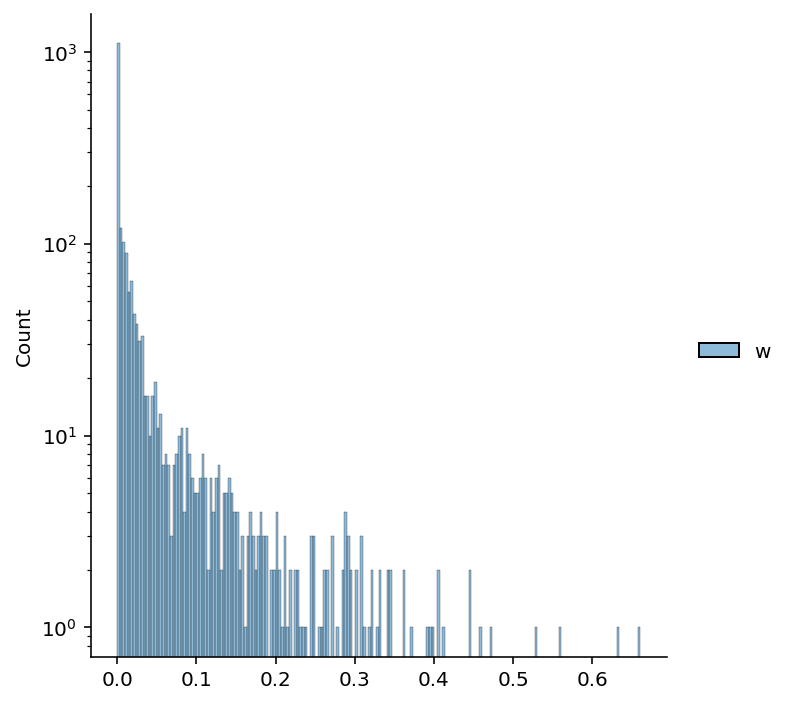

In [16]:
sns.displot(corr_mtx)
plt.yscale('log')

In [17]:
corr_mtx.w.quantile(0.8)

0.030693723454459657

In [18]:
G = gt.Graph(directed=False)
ids = G.add_edge_list(corr_mtx[corr_mtx.w >= corr_mtx.w.quantile(0.8)][['A', 'B']].values, hashed=True)

In [19]:
pos = gt.sfdp_layout(G)

In [79]:
index2ids={v: ids[v] for v in G.iter_vertices()}
print('Number of Nodes/Diseases', len(index2ids) )

Number of Nodes/Diseases 64


In [35]:
index2ids

{0: 'abdominal aortic aneurysm',
 1: 'atherosclerosis',
 2: 'brain aneurysm',
 3: 'coronary atherosclerosis',
 4: 'familial thoracic aortic aneurysm and aortic dissection',
 5: 'heart disease',
 6: 'heart failure',
 7: 'large artery stroke',
 8: 'macrovascular complications of diabetes',
 9: 'moyamoya disease',
 10: 'myocardial infarction',
 11: 'myocardial ischemia',
 12: 'peripheral arterial disease',
 13: 'peripheral vascular disease',
 14: 'stroke',
 15: 'thoracic aortic aneurysm',
 16: 'arrhythmogenic right ventricular dysplasia',
 17: 'atrial flutter',
 18: 'autosomal dominant dilated cardiomyopathy',
 19: 'brugada syndrome',
 20: 'cardiac arrhythmia',
 21: 'cardiac edema',
 22: 'cardiomyopathy',
 23: 'catecholaminergic polymorphic ventricular tachycardia',
 24: 'congenital heart disease',
 25: 'dilated cardiomyopathy',
 26: 'familial dilated cardiomyopathy',
 27: 'familial hypertrophic cardiomyopathy',
 28: 'familial isolated arrhythmogenic right ventricular dysplasia',
 29: 'fa

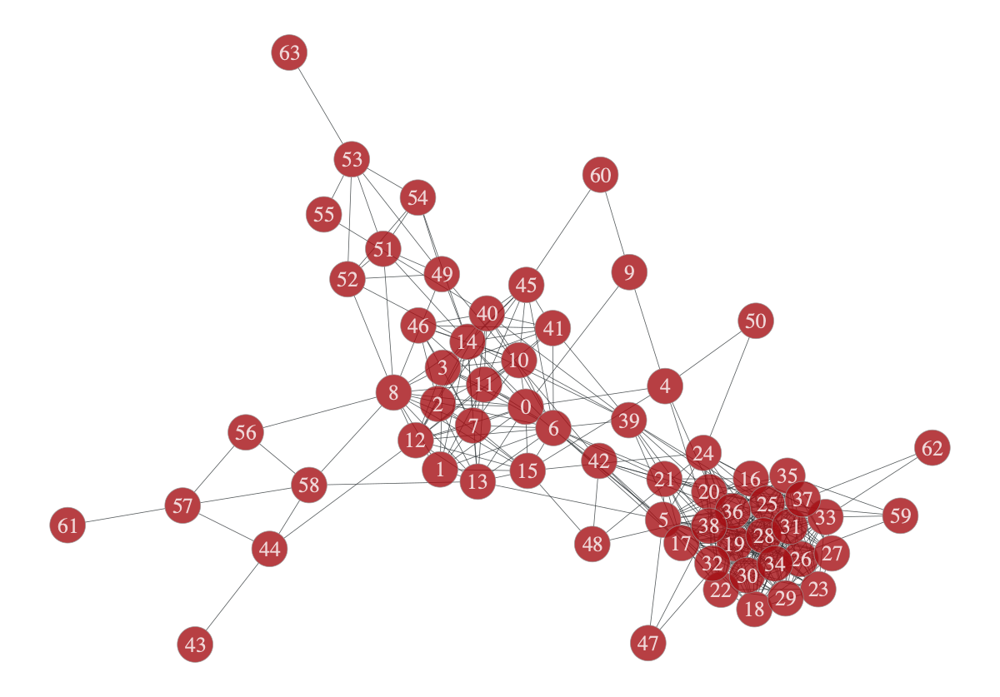

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f8dc1681e10, at 0x7f8dc1bd0940>

In [49]:
gt.graph_draw(G, pos=pos, edge_pen_width=0.4, vertex_pen_width=0.4, vertex_text=G.vertex_index)

In [76]:
gt.graph_draw(G, pos=pos, edge_pen_width=0.4, vertex_pen_width=0.4, vertex_text=ids, 
              vertex_font_size=40, vertex_text_position=0, output_size=(5000, 5000), vertex_text_offset=[-1.5,0])


<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f8dc1681e10, at 0x7f8dc1bd0940>

In [21]:
state = gt.minimize_blockmodel_dl(G)

In [22]:
# communities retrieved
set(state.get_blocks().a)

{0, 1}

In [23]:
dict(zip([ids[v] for v in G.iter_vertices()], state.get_blocks().a))

{'abdominal aortic aneurysm': 0,
 'atherosclerosis': 0,
 'brain aneurysm': 0,
 'coronary atherosclerosis': 0,
 'familial thoracic aortic aneurysm and aortic dissection': 0,
 'heart disease': 1,
 'heart failure': 0,
 'large artery stroke': 0,
 'macrovascular complications of diabetes': 0,
 'moyamoya disease': 0,
 'myocardial infarction': 0,
 'myocardial ischemia': 0,
 'peripheral arterial disease': 0,
 'peripheral vascular disease': 0,
 'stroke': 0,
 'thoracic aortic aneurysm': 0,
 'arrhythmogenic right ventricular dysplasia': 1,
 'atrial flutter': 1,
 'autosomal dominant dilated cardiomyopathy': 1,
 'brugada syndrome': 1,
 'cardiac arrhythmia': 1,
 'cardiac edema': 1,
 'cardiomyopathy': 1,
 'catecholaminergic polymorphic ventricular tachycardia': 1,
 'congenital heart disease': 1,
 'dilated cardiomyopathy': 1,
 'familial dilated cardiomyopathy': 1,
 'familial hypertrophic cardiomyopathy': 1,
 'familial isolated arrhythmogenic right ventricular dysplasia': 1,
 'familial isolated dilated

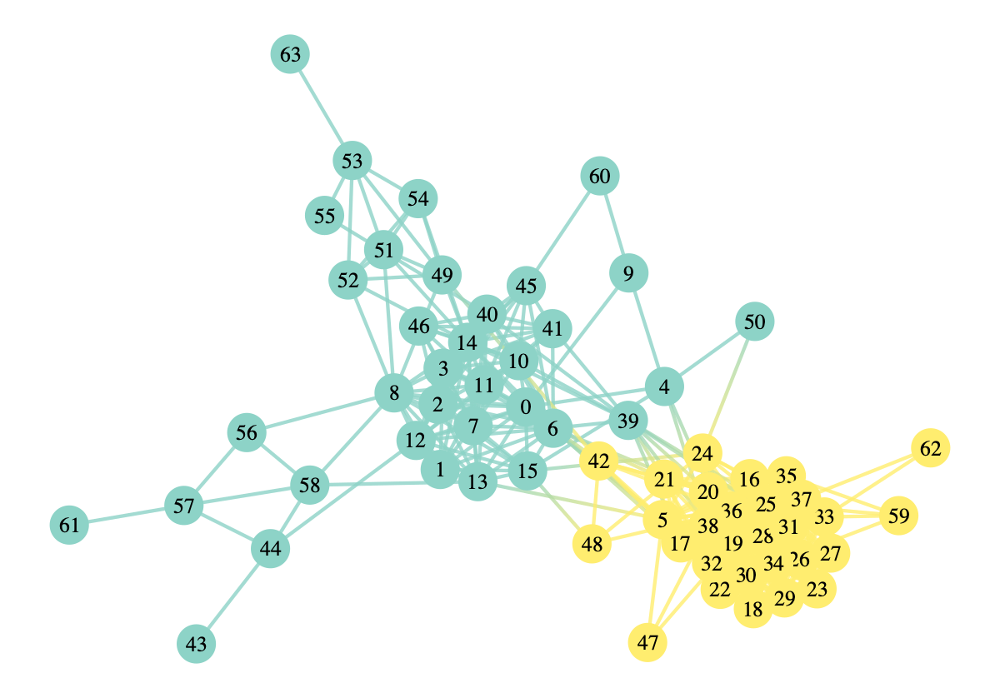

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f8dc1681e10, at 0x7f8dc1bd0940>

In [31]:
state.draw(pos=pos, vertex_text=G.vertex_index)

In [88]:
state.draw(pos=pos, vertex_text=ids, 
              vertex_font_size=40, vertex_text_position=0, output_size=(5000, 5000), vertex_text_offset=[-1.5,0])

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f8dc1681e10, at 0x7f8dc1bd0940>